In [4]:
import os
import pickle
import cv2
import mediapipe as mp

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)

DATA_DIR = './data'

data = []
labels = []

# Buka file data.txt untuk ditulisi
with open('../data.txt', 'w') as txt_file:
    for dir_ in os.listdir(DATA_DIR):
        for img_path in os.listdir(os.path.join(DATA_DIR, dir_)):
            data_aux = []
            x_ = []
            y_ = []

            img = cv2.imread(os.path.join(DATA_DIR, dir_, img_path))
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            results = hands.process(img_rgb)
            if results.multi_hand_landmarks:
                for hand_landmarks in results.multi_hand_landmarks:
                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        x_.append(x)
                        y_.append(y)

                    for i in range(len(hand_landmarks.landmark)):
                        x = hand_landmarks.landmark[i].x
                        y = hand_landmarks.landmark[i].y
                        data_aux.append(x - min(x_))
                        data_aux.append(y - min(y_))

                data.append(data_aux)
                labels.append(dir_)

                # Tulis ke file data.txt (gabungkan semua data + label)
                txt_file.write(','.join(map(str, data_aux)) + f',{dir_}\n')

# Simpan ke pickle
with open('../data.pickle', 'wb') as f:
    pickle.dump({'data': data, 'labels': labels}, f)


x: 0.28717342
y: 0.452388614
z: -2.76283799e-007

x: 0.337923229
y: 0.423785776
z: -0.0135663105

x: 0.370541722
y: 0.353920698
z: -0.0147871077

x: 0.375762135
y: 0.290824145
z: -0.0173802227

x: 0.387639731
y: 0.245495945
z: -0.0175063498

x: 0.344743133
y: 0.300959736
z: 0.00583109772

x: 0.358411819
y: 0.263302267
z: -0.0183175392

x: 0.354866773
y: 0.306453794
z: -0.0321609378

x: 0.350025535
y: 0.348132879
z: -0.0352269262

x: 0.314587295
y: 0.300609171
z: 0.00522411

x: 0.332840413
y: 0.264431298
z: -0.0228727311

x: 0.328571886
y: 0.320253938
z: -0.0305826496

x: 0.325255275
y: 0.368641973
z: -0.0260547698

x: 0.284968138
y: 0.30423072
z: -0.000258059823

x: 0.304473907
y: 0.285645962
z: -0.0298144482

x: 0.301772565
y: 0.345049083
z: -0.0277538616

x: 0.3005099
y: 0.388426781
z: -0.0151200583

x: 0.254447967
y: 0.312772244
z: -0.00678371312

x: 0.277023315
y: 0.295155972
z: -0.0254873503

x: 0.278883189
y: 0.340533286
z: -0.0213813856

x: 0.278040677
y: 0.374970317
z: -0.01108

C:\Users\ACER\AppData\Local\Temp\ipykernel_126208\3256153072.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


x: 0.111088306
y: 0.88932848
z: 6.31889293e-007

x: 0.157112569
y: 0.877105296
z: -0.0308184195

x: 0.191445366
y: 0.830874145
z: -0.04529313

x: 0.16789639
y: 0.790395379
z: -0.0585384555

x: 0.135825038
y: 0.758055925
z: -0.0702506825

x: 0.195233703
y: 0.711886883
z: -0.0257572699

x: 0.226498246
y: 0.634557664
z: -0.0511874408

x: 0.248028606
y: 0.586677194
z: -0.0651050508

x: 0.262984633
y: 0.54376924
z: -0.0708019

x: 0.154328898
y: 0.696034133
z: -0.0258780606

x: 0.151795641
y: 0.606600881
z: -0.0584411658

x: 0.148432881
y: 0.544470251
z: -0.0769032463

x: 0.14388448
y: 0.492314726
z: -0.0815874487

x: 0.115802102
y: 0.703610122
z: -0.0288833119

x: 0.122319609
y: 0.71057564
z: -0.0754112601

x: 0.131529808
y: 0.772907615
z: -0.0858489

x: 0.135757148
y: 0.815223038
z: -0.0760522261

x: 0.0813791305
y: 0.723883688
z: -0.0333420187

x: 0.0943367854
y: 0.740007102
z: -0.0678348541

x: 0.104435906
y: 0.796594083
z: -0.0683402419

x: 0.110335693
y: 0.835962236
z: -0.0569336563

x

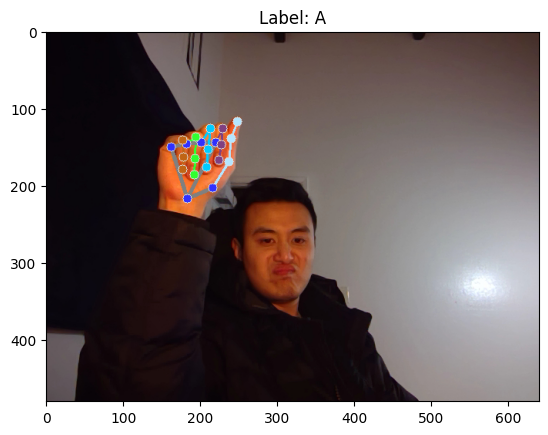

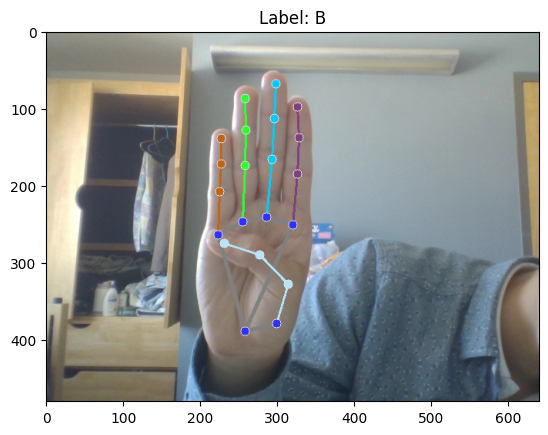

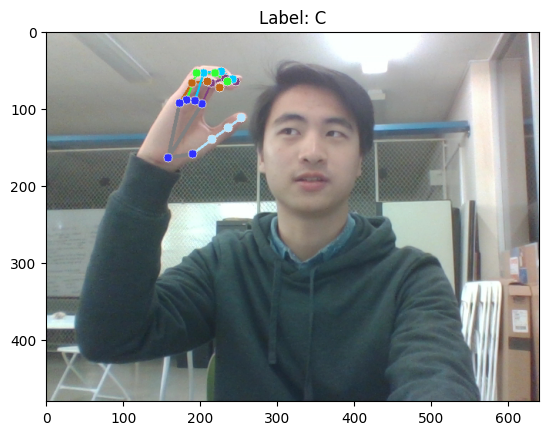

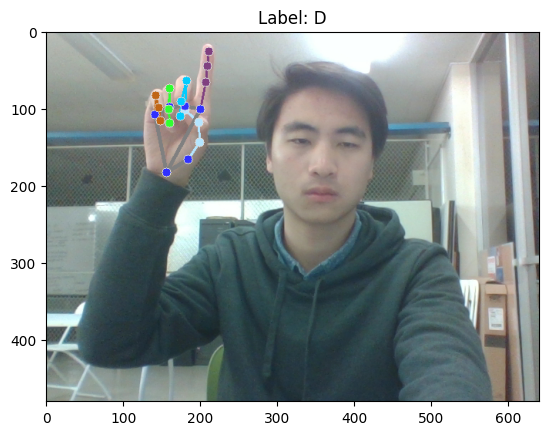

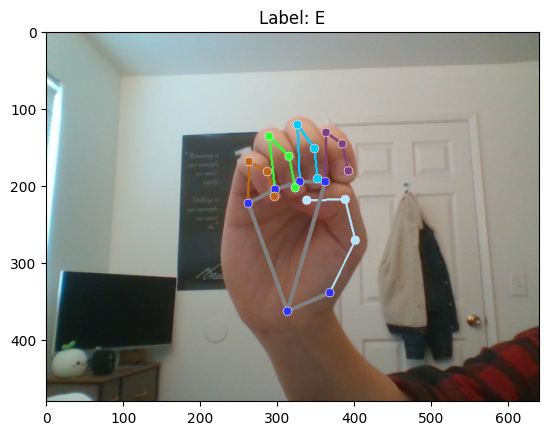

...

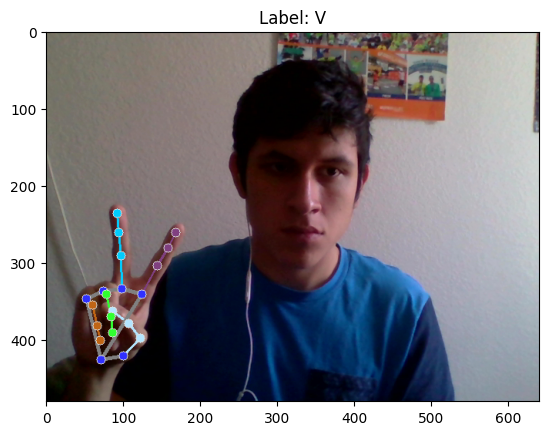

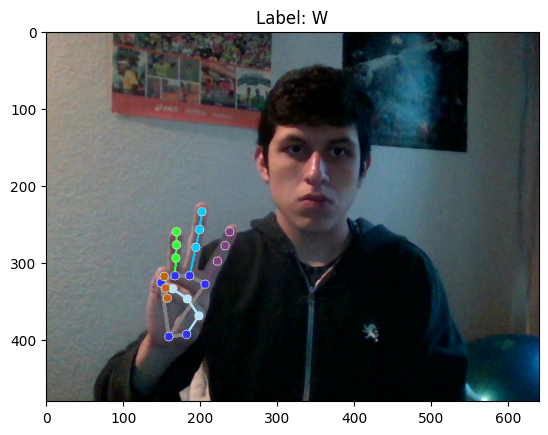

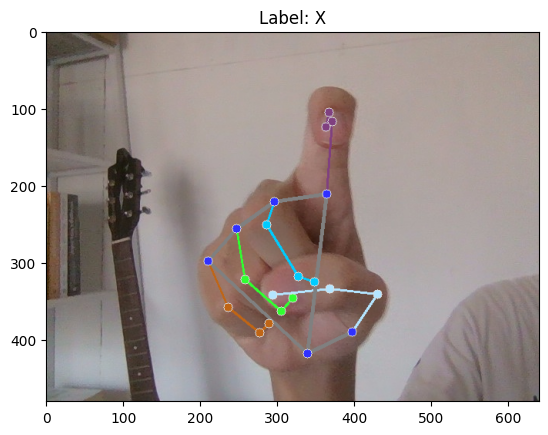

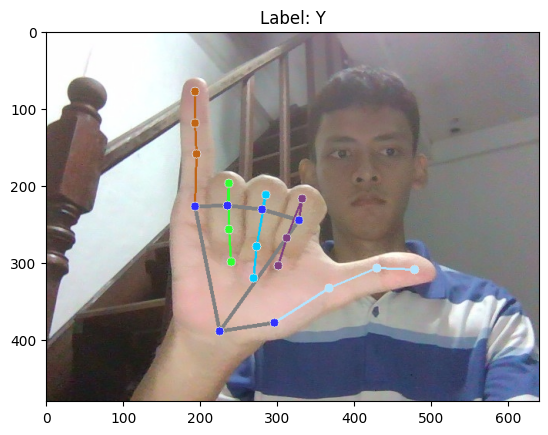

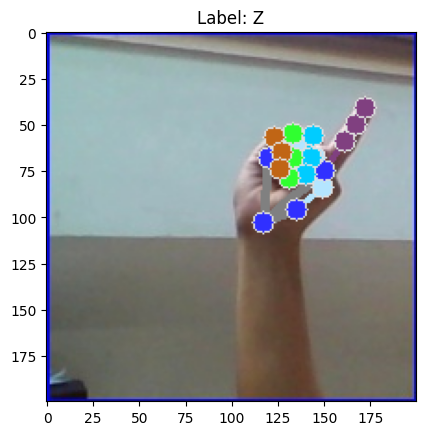

In [14]:
# Ekstraksi Fitur + Landmark
import os
import pickle
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)

DATA_DIR = './data'

data = []
labels = []

for dir_ in os.listdir(DATA_DIR):
    img_list = os.listdir(os.path.join(DATA_DIR, dir_))
    img_list.sort()  # urutkan biar median konsisten
    median_idx = len(img_list) // 2
    img_path = img_list[median_idx]  # ambil gambar tengah

    data_aux = []
    img = cv2.imread(os.path.join(DATA_DIR, dir_, img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    results = hands.process(img_rgb)
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_drawing.draw_landmarks(
                img_rgb,
                hand_landmarks,
                mp_hands.HAND_CONNECTIONS,
                mp_drawing_styles.get_default_hand_landmarks_style(),
                mp_drawing_styles.get_default_hand_connections_style()
            )
            for i in range(len(hand_landmarks.landmark)):
                print(hand_landmarks.landmark[i])
                data_aux.append([
                    hand_landmarks.landmark[i].x,
                    hand_landmarks.landmark[i].y,
                ])
        data.append(data_aux)
        labels.append(dir_)

    plt.figure()
    plt.title(f'Label: {dir_}')
    plt.imshow(img_rgb)

plt.show()

C:\Users\ACER\AppData\Local\Temp\ipykernel_126208\2827950183.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(label_counts.keys()), y=list(label_counts.values()), palette="viridis")


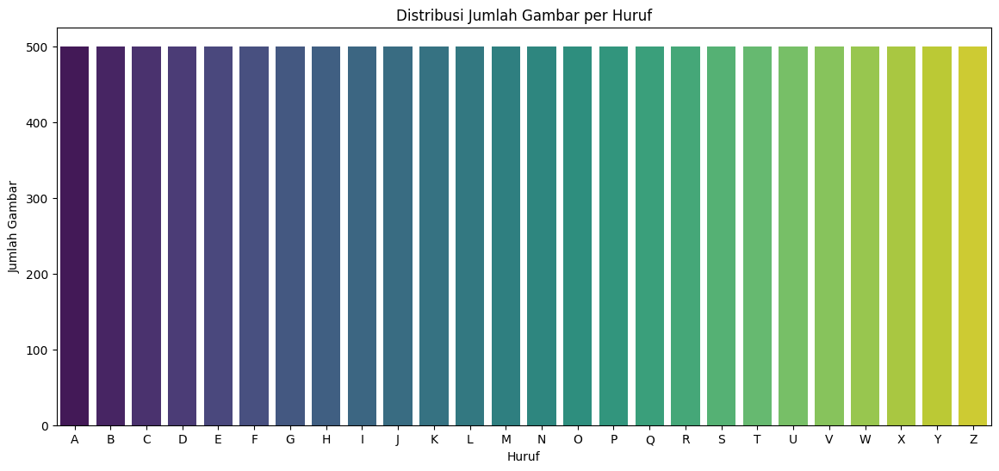

In [18]:
import os
import matplotlib.pyplot as plt
import seaborn as sns

DATA_DIR = './data'

# Hitung jumlah file per folder/huruf
label_counts = {}
for dir_ in os.listdir(DATA_DIR):
    dir_path = os.path.join(DATA_DIR, dir_)
    if os.path.isdir(dir_path):
        num_files = len([file for file in os.listdir(dir_path) if file.lower().endswith(('.png', '.jpg', '.jpeg'))])
        label_counts[dir_] = num_files

# Urutkan berdasarkan abjad label
label_counts = dict(sorted(label_counts.items()))

# Visualisasi pakai seaborn
plt.figure(figsize=(14, 6))
sns.barplot(x=list(label_counts.keys()), y=list(label_counts.values()), palette="viridis")
plt.title('Distribusi Jumlah Gambar per Huruf')
plt.xlabel('Huruf')
plt.ylabel('Jumlah Gambar')
plt.show()


In [19]:
# test_data

import os
import pickle
import cv2
import mediapipe as mp

mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)

TEST_DATA_DIR = './test_data'

data = []
labels = []

# Buka file untuk menyimpan hasil data
with open('../test_data.txt', 'w') as txt_file:
    for img_file in os.listdir(TEST_DATA_DIR):
        if not img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue  # lewati file non-gambar

        label = os.path.splitext(img_file)[0].upper()  # nama file = label, uppercase
        data_aux = []
        x_ = []
        y_ = []

        img = cv2.imread(os.path.join(TEST_DATA_DIR, img_file))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        results = hands.process(img_rgb)
        if results.multi_hand_landmarks:
            for hand_landmarks in results.multi_hand_landmarks:
                for i in range(len(hand_landmarks.landmark)):
                    x = hand_landmarks.landmark[i].x
                    y = hand_landmarks.landmark[i].y
                    x_.append(x)
                    y_.append(y)

                for i in range(len(hand_landmarks.landmark)):
                    x = hand_landmarks.landmark[i].x
                    y = hand_landmarks.landmark[i].y
                    data_aux.append(x - min(x_))
                    data_aux.append(y - min(y_))

            data.append(data_aux)
            labels.append(label)

            # Tulis ke test_data.txt
            txt_file.write(','.join(map(str, data_aux)) + f',{label}\n')

# Simpan ke pickle
with open('../test_data.pickle', 'wb') as f:
    pickle.dump({'data': data, 'labels': labels}, f)


C:\Users\ACER\AppData\Local\Temp\ipykernel_126208\2136951447.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


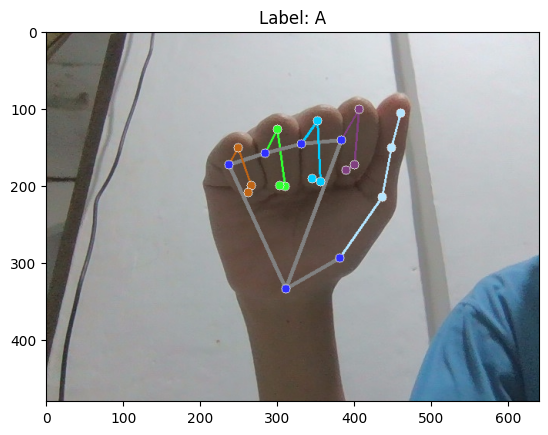

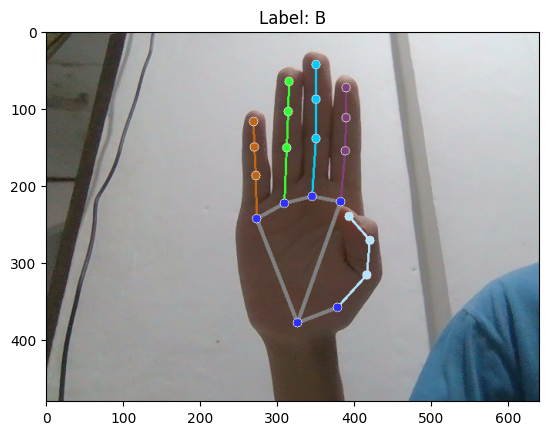

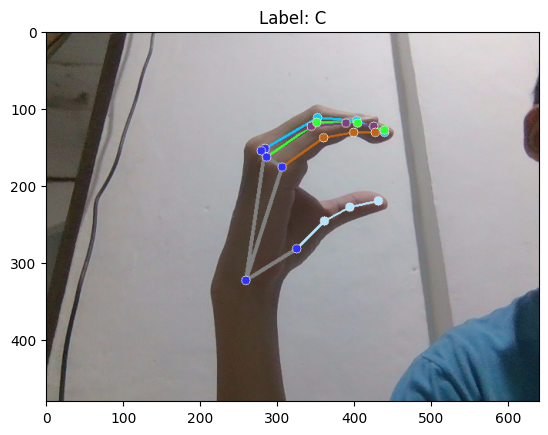

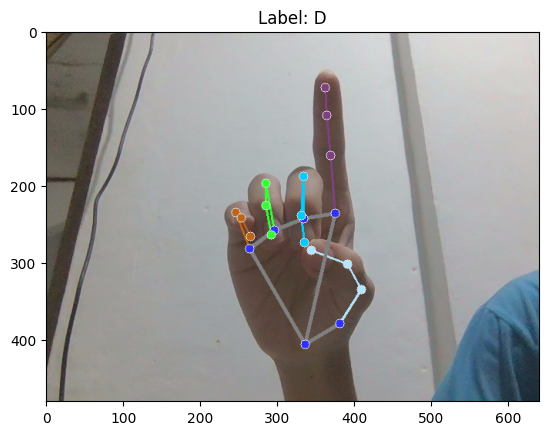

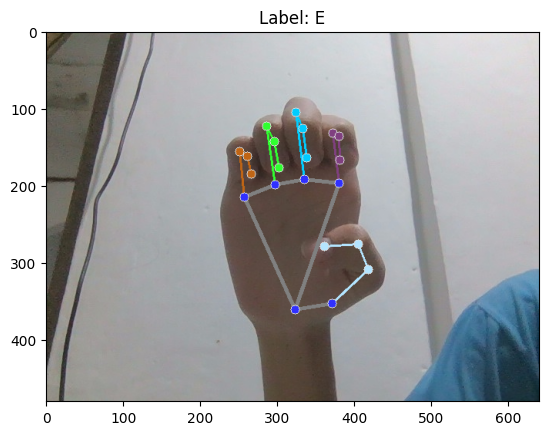

...

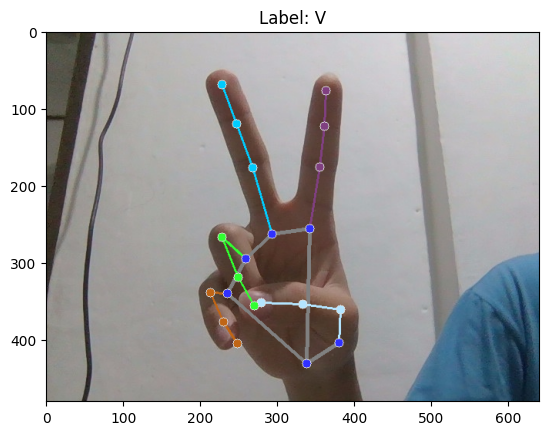

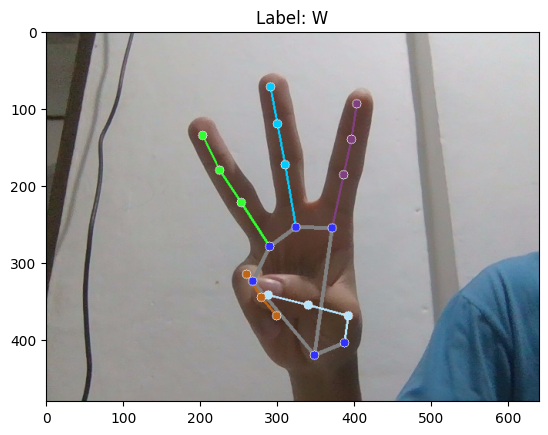

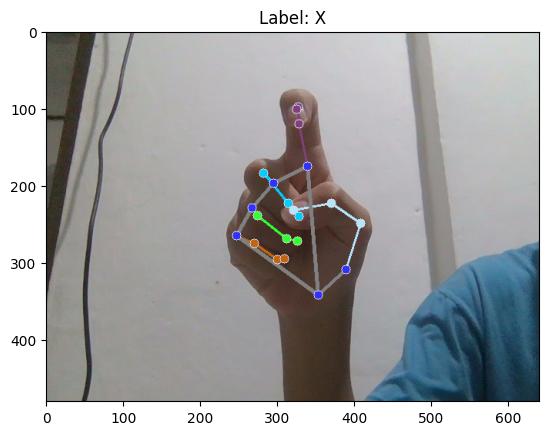

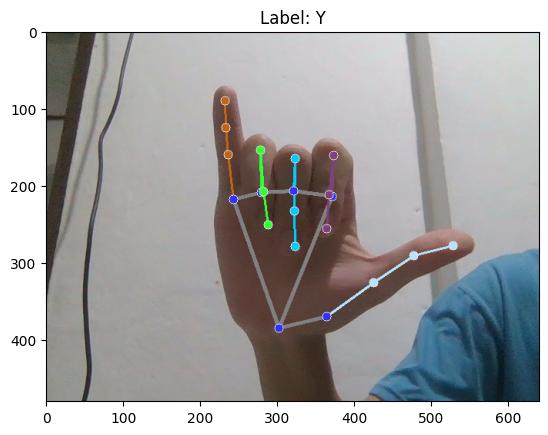

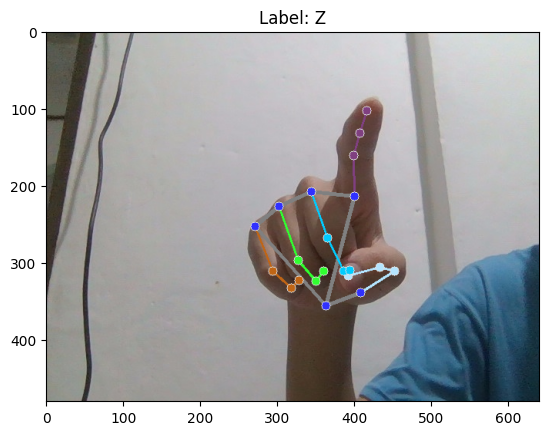

In [20]:
# test data

import os
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt

mp_hands = mp.solutions.hands
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles

hands = mp_hands.Hands(static_image_mode=True, min_detection_confidence=0.3)

TEST_DATA_DIR = './test_data'

data = []
labels = []

img_files = sorted([
    f for f in os.listdir(TEST_DATA_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])

for img_file in img_files:
    label = os.path.splitext(img_file)[0].upper()
    data_aux = []

    img_path = os.path.join(TEST_DATA_DIR, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    results = hands.process(img_rgb)
    if results.multi_hand_landmarks:
        for hand_landmarks in results.multi_hand_landmarks:
            mp_drawing.draw_landmarks(
                img_rgb,
                hand_landmarks,
                mp_hands.HAND_CONNECTIONS,
                mp_drawing_styles.get_default_hand_landmarks_style(),
                mp_drawing_styles.get_default_hand_connections_style()
            )

            for i in range(len(hand_landmarks.landmark)):
                data_aux.append([
                    hand_landmarks.landmark[i].x,
                    hand_landmarks.landmark[i].y
                ])

        data.append(data_aux)
        labels.append(label)

        # Tampilkan hasil
        plt.figure()
        plt.title(f'Label: {label}')
        plt.imshow(img_rgb)

plt.show()
